In [1]:
import pandas as pd
import glob
import boto3
import os
import shutil
import re
from datetime import datetime
import matplotlib.pyplot as plt

In [2]:
AWS_ACCESS_KEY_ID = ''
AWS_SECRET_ACCESS_KEY = ''
COMPANIES = []
ENDING_YEAR = '2021'
COMPANIES_LIST = []

In [3]:
DATA_PATH = './data'
RAW_PARQUET_DATA_PATH = DATA_PATH + '/0_raw_parquet_data'
RAW_CSV_DATA_PATH = DATA_PATH + '/1_raw_csv_data'
SLIM_DATA_PATH = DATA_PATH + '/2_slim_data'
MERGED_DATA_PATH = DATA_PATH + '/3_merged_data'
PREPROCESSED_DATA_PATH = DATA_PATH + '/4_preprocessed_data'
PLOTS = './plots'

### TEST_PARQUET 

In [78]:
s3 = boto3.resource('s3',
    aws_access_key_id = AWS_ACCESS_KEY_ID,
    aws_secret_access_key = AWS_SECRET_ACCESS_KEY)

bucket = s3.Bucket('aws-bucket')

In [ ]:
for COMPANY in COMPANIES:
    if os.path.exists(RAW_PARQUET_DATA_PATH + '/{0}'.format(COMPANY)):
        shutil.rmtree(RAW_PARQUET_DATA_PATH + '/{0}'.format(COMPANY))
    os.mkdir(RAW_PARQUET_DATA_PATH + '/{0}'.format(COMPANY))
        
    print('Downloading trades for company {0}...'.format(COMPANY))

    for obj in bucket.objects.filter(Prefix='trades/symbol={0}'.format(COMPANY)): 
        path, filename = os.path.split(obj.key)
        bucket.download_file(obj.key, RAW_PARQUET_DATA_PATH + '/{0}/'.format(COMPANY) + filename)
        print('Trades: {0}:{1}'.format(bucket.name, obj.key))
        # check the year
        files = os.listdir(RAW_PARQUET_DATA_PATH + '/{0}'.format(COMPANY)) 
        number_files = len(files)
        print(number_files)
        if (number_files>6):
            break

    m = re.search('(date=)(\d{8})', obj.key)
    STARTING_YEAR = m.group(2)[:4]
    COMPANIES_LIST.append((COMPANY, STARTING_YEAR, ENDING_YEAR))
    print('\n')
    print('---------------------------------------------------------------------------------------------')
    print('Test for {0} has ended!'.format(COMPANY))
    print('---------------------------------------------------------------------------------------------')
    print('\n')

# DOWNLOAD_PARQUET + PAR-> CSV + CSV SLIM

In [ ]:
for COMPANY in COMPANIES_LIST:    
    STARTING_YEAR = COMPANY[1]
    ENDING_YEAR = COMPANY[2]
    YEARS = []
    YEAR = int(STARTING_YEAR)
    END_YEAR = int(ENDING_YEAR)
    while (YEAR <= END_YEAR):
        YEARS.append('{0}'.format(YEAR))
        YEAR+=1    
    
    if os.path.exists(RAW_PARQUET_DATA_PATH + '/{0}'.format(COMPANY[0])):
            shutil.rmtree(RAW_PARQUET_DATA_PATH + '/{0}'.format(COMPANY[0]))
    os.mkdir(RAW_PARQUET_DATA_PATH + '/{0}'.format(COMPANY[0]))
    
    #0. MEASURE EXECUTION TIME
    start_time = datetime.now()
    
    #1. DOWNLOAD PARQUET
    for year in YEARS: 
        os.mkdir(RAW_PARQUET_DATA_PATH + '/{0}/{0}{1}'.format(COMPANY[0], year))
        print('Downloading trades for company {0}, year {1}...'.format(COMPANY[0], year))

        for obj in bucket.objects.filter(Prefix='trades/symbol={0}/date={1}'.format(COMPANY[0], year)): 
            path, filename = os.path.split(obj.key)
            bucket.download_file(obj.key, RAW_PARQUET_DATA_PATH + '/{0}/{0}{1}/'.format(COMPANY[0], year) + filename)
            print('Trades: {0}:{1}'.format(bucket.name, obj.key))

        print('\n')
        print('---------------------------------------------------------------------------------------------')
        print('All trades for company {0}, year {1} downloaded!!'.format(COMPANY[0], year))
        print('---------------------------------------------------------------------------------------------')
        print('\n')
    #1.2. Save info to log file
    now = datetime.now()
    dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
    with open("log_file.txt", "a") as file_object:
        file_object.write('Companies downloaded in parquet format at {0}: \n'.format(dt_string))
        file_object.write('{0}\n'.format(COMPANIES_LIST))
    
    #2. TRANSFORM FROM PARQUET TO CSV
    for year in YEARS:
        first = True
        counter = 0
        global df
        for file in os.listdir(RAW_PARQUET_DATA_PATH + '/{0}/{0}{1}'.format(COMPANY[0], year)):     
            if file.endswith('.parquet'):
                filename = file
                source = pd.read_parquet(RAW_PARQUET_DATA_PATH + '/{0}/{0}{1}/'.format(COMPANY[0], year) + filename)
                if first:
                    df = source
                    df.to_csv(RAW_CSV_DATA_PATH + '/{0}{1}.csv'.format(COMPANY[0], year))
                    print('First parquet file from year {0} converted to csv!'.format(year))
                    counter += 1
                    first = False
                else:
                    df = source
                    df.to_csv(RAW_CSV_DATA_PATH + '/{0}{1}.csv'.format(COMPANY[0], year), mode='a', header=False)
                    counter += 1 
                    if ((counter % 100) == 0):
                        print('-------------------------------------------------')
                        print('Counter: ' + str(counter))
                        print('Next 100 parquet files appended to csv file!')  
                        print('-------------------------------------------------')
    #2.2. Save info to log file
    now = datetime.now()
    dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
    with open("log_file.txt", "a") as file_object:
        # Append at the end of file
        file_object.write('Companies transformed to csv format at {0}: \n'.format(dt_string))
        file_object.write('{0}\n'.format(COMPANIES_LIST))
    
    #3. TRANSFORM TO CSV SLIM
    RAW_CSV_DATA_FILES_PATHS = glob.glob(RAW_CSV_DATA_PATH + "/*.csv")
    for file_path in RAW_CSV_DATA_FILES_PATHS:
        df = pd.read_csv(file_path, usecols=['timestamp', 'price'], dtype={'price': 'float64'})
        df.timestamp = pd.to_datetime(df.timestamp)
        df.sort_values(by='timestamp', axis=0, inplace=True)
        # ewentualne filtrowanie
        df = df.groupby(pd.Grouper(key='timestamp', freq='D')).agg(
            avg_price = ('price', 'mean'),
            transactions_count = ('price', 'count')
        )
        new_file_path = SLIM_DATA_PATH + '\\' + file_path.split('\\')[-1]
        df.to_csv(new_file_path)
    
    #3.2. REMOVE RAW_PARQUET_DATA_PATH content
    files = glob.glob(RAW_PARQUET_DATA_PATH + '/*')
    for f in files:
        shutil.rmtree(f)
        
    #3.3. REMOVE RAW_CSV_DATA_PATH content
    files = glob.glob(RAW_CSV_DATA_PATH + '/*')
    for f in files:
        os.remove(f)
        
    #4. MEASURE SCRIPT EXECUTION TIME
    end_time = datetime.now()
    execution_time = end_time - start_time
    with open("log_file.txt", "a") as file_object:
        file_object.write('{0} execution time duration: {1} h:min:s.milis\n'.format(COMPANY[0], execution_time))

# Merge Data

In [102]:
SLIM_DATA_FILES_PATHS = glob.glob(SLIM_DATA_PATH + "/*.csv")
SLIM_DATA_PATHS_DF = pd.DataFrame(SLIM_DATA_FILES_PATHS, columns=['path'])
SLIM_DATA_PATHS_DF['file_name'] = SLIM_DATA_PATHS_DF.path.str.split('\\', expand=True).iloc[:, -1]
SLIM_DATA_PATHS_DF[['company', 'year']] = SLIM_DATA_PATHS_DF.file_name.str.split('(\w+)(\d{4}).csv', expand=True).iloc[:,1:-1]

for company in SLIM_DATA_PATHS_DF.company.unique():
    df = pd.DataFrame()
    for file_path in SLIM_DATA_PATHS_DF[SLIM_DATA_PATHS_DF.company==company].path:
        partial_df = pd.read_csv(file_path, usecols=['timestamp', 'avg_price', 'transactions_count'], dtype={'avg_price': 'float64'})
        partial_df.timestamp = pd.to_datetime(partial_df.timestamp)
        df = df.append(partial_df)
    df.sort_values(by='timestamp', axis=0, inplace=True)
    new_file_path = f"{MERGED_DATA_PATH}\\{company}.csv" 
    df.to_csv(new_file_path)        


# Process Data

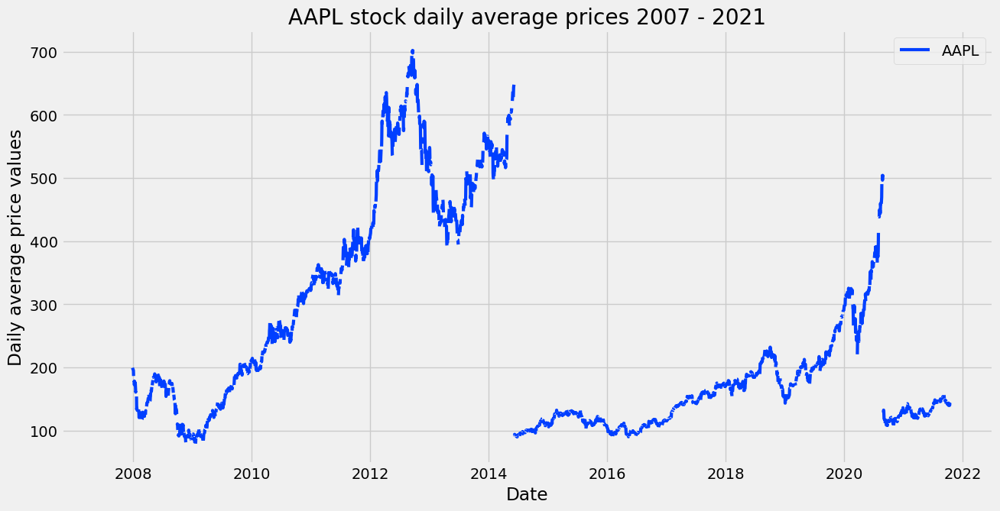

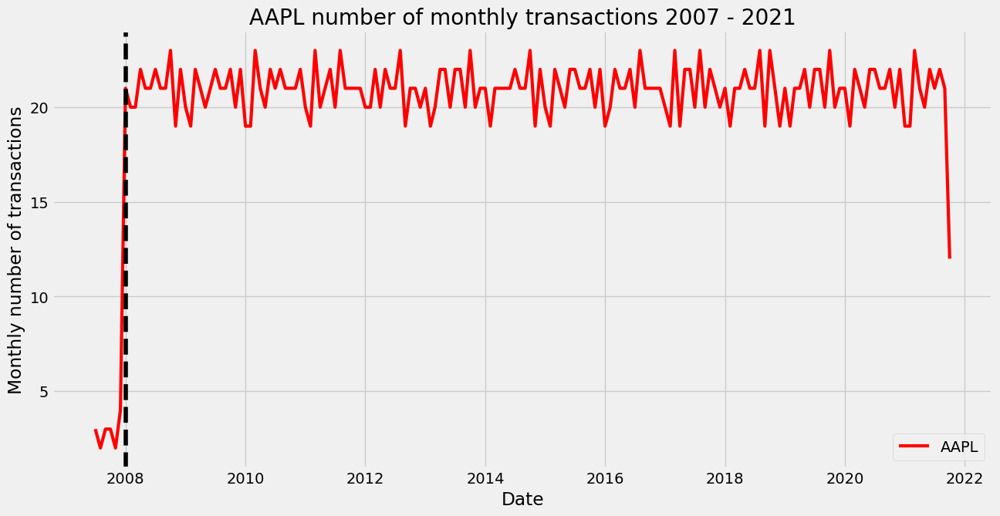

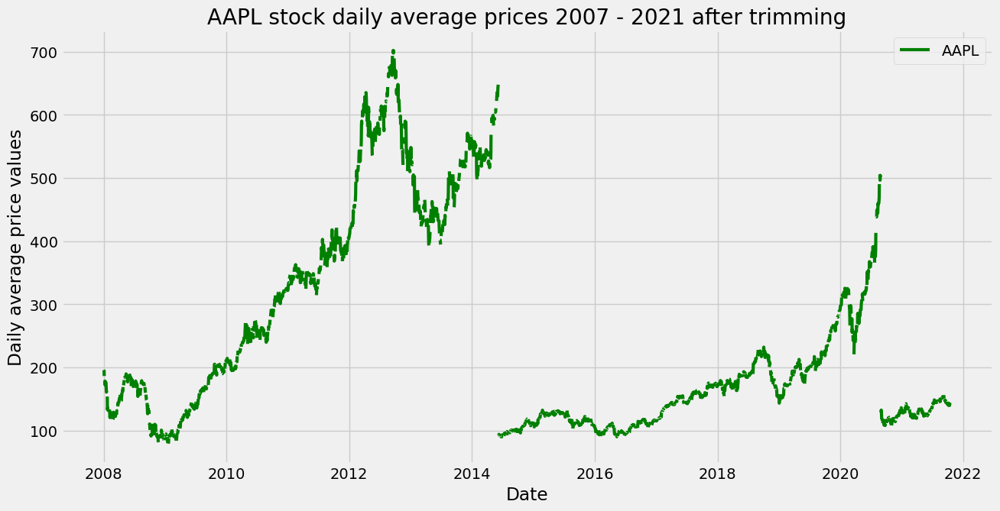

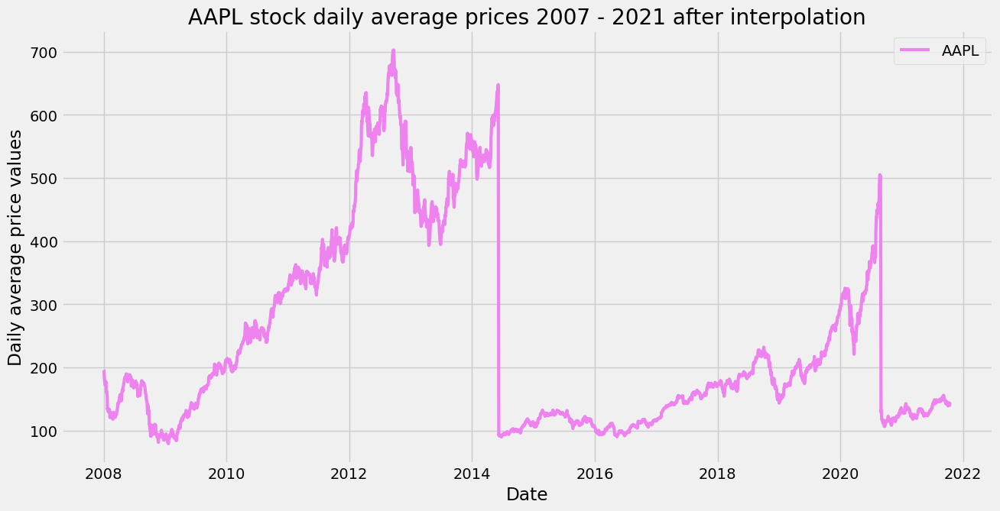

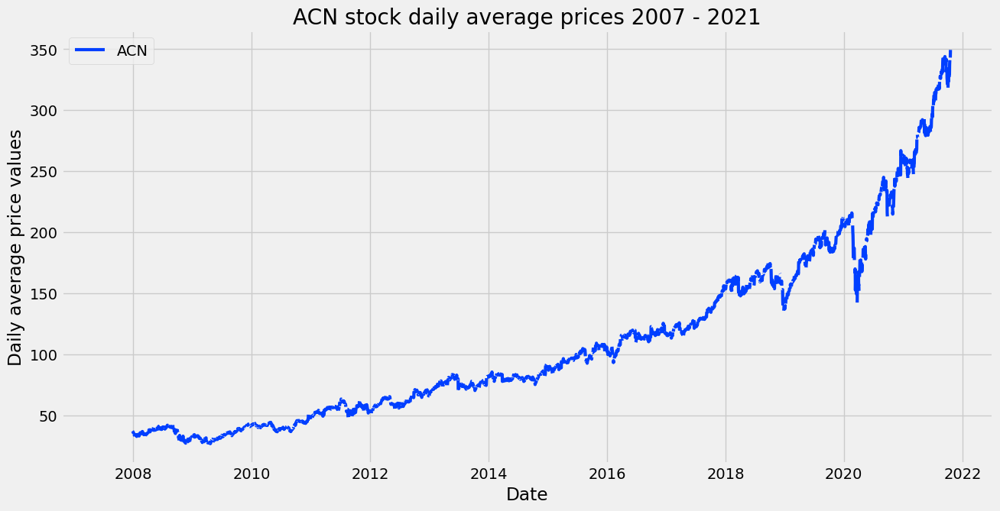

...

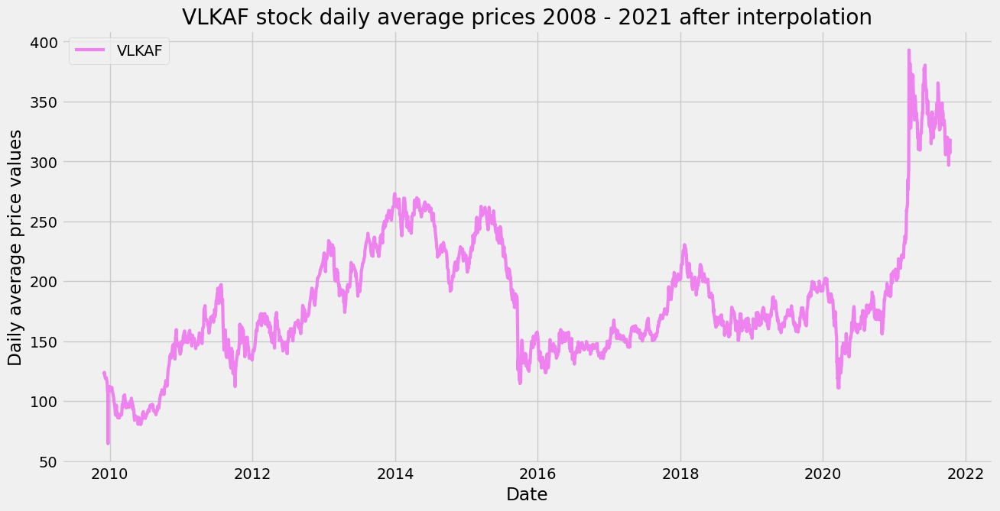

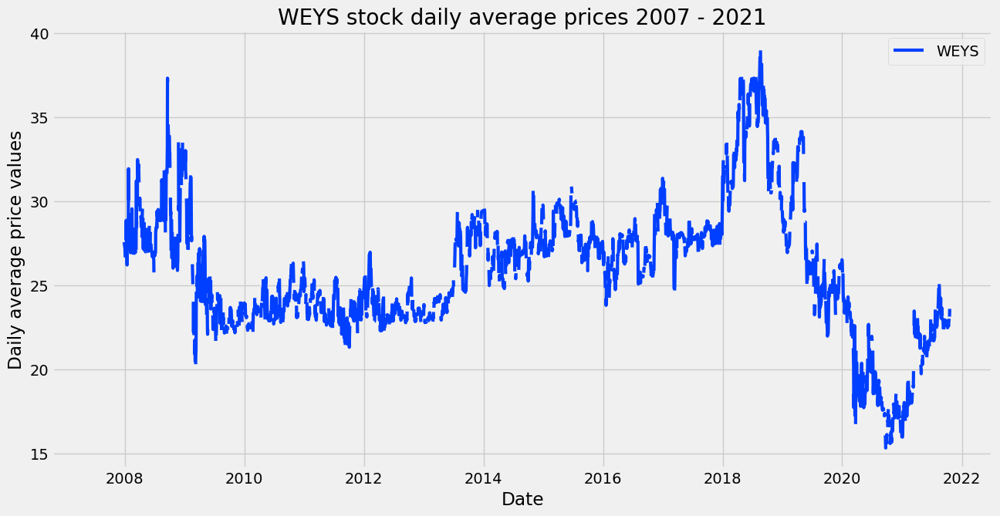

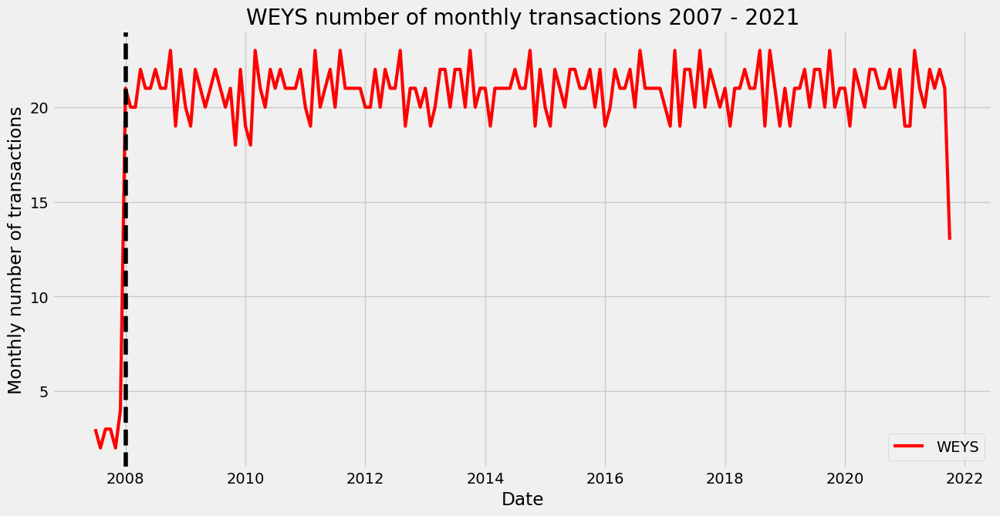

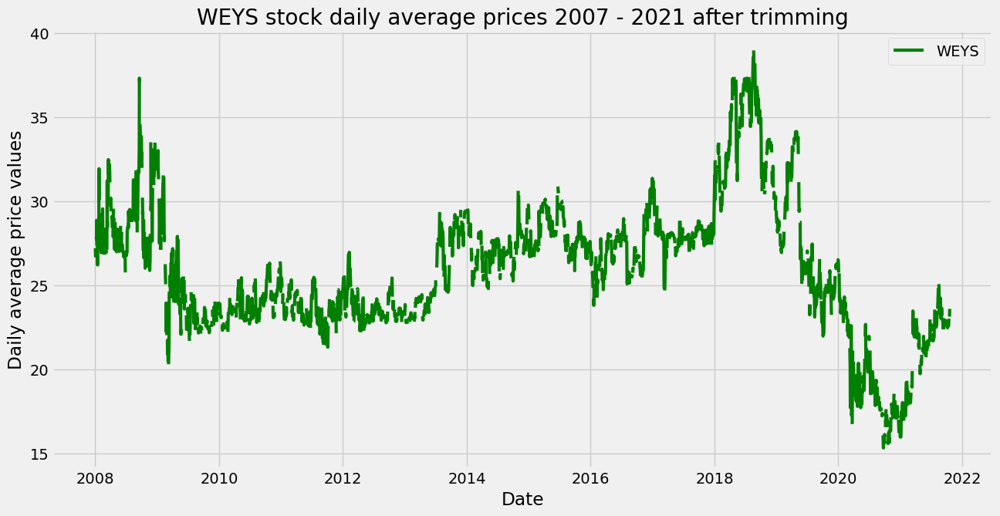

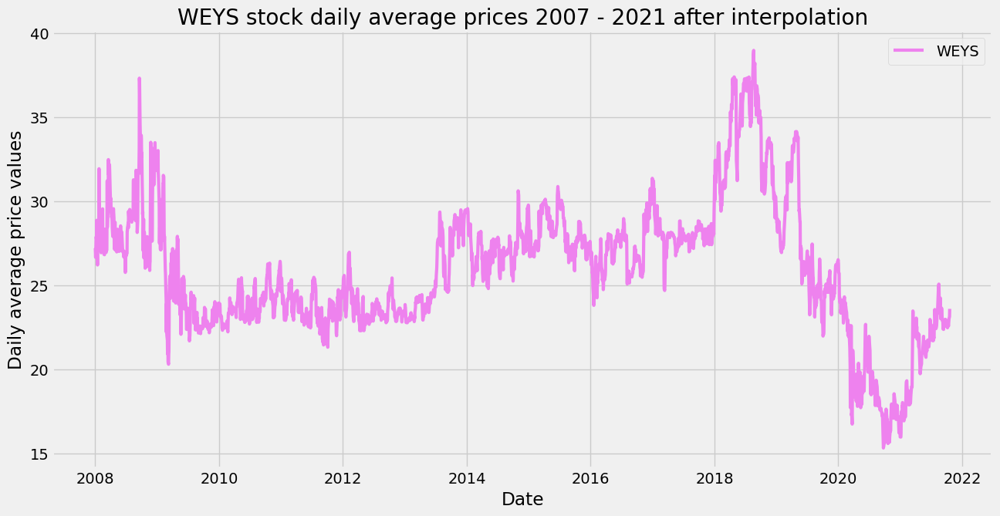

In [4]:
MONTHLY_TRANSACTIONS_THREASHOLD = 10
plt.style.use('fivethirtyeight')
plt.style.use('seaborn-bright')

MERGED_DATA_PATHS = glob.glob(MERGED_DATA_PATH + "/*.csv")
for file_path in MERGED_DATA_PATHS:
    #extract company name for further plots
    splitted = file_path.split("\\")[-1]
    company = splitted.split(".csv")[0]
    
    df = pd.read_csv(file_path, 
                     usecols=['timestamp', 'avg_price', 'transactions_count'], 
                     dtype={'avg_price': 'float64', 'transactions_count': 'int64'})
    df.timestamp = pd.to_datetime(df.timestamp)
    #time interval for the given company
    starting_year = df['timestamp'][0].year
    ending_year = df['timestamp'][len(df)-1].year
    
    # plot before trimming
    plt.figure(figsize=(14, 7), dpi=100)
    plt.plot(df['timestamp'], df['avg_price'], linewidth=3, linestyle='solid')
    plt.title('{0} stock daily average prices {1} - {2}'.format(company, starting_year, ending_year))
    plt.xlabel('Date')
    plt.ylabel('Daily average price values')
    plt.legend(['{0}'.format(company)]) 
    plt.savefig(PLOTS + '/{0}_stock_daily_average_prices_{1}_{2}.png'.format(company, starting_year, ending_year));
    plt.show()
    
    # calculate starting point
    transactions_count_monthly_df = df.groupby(pd.Grouper(key='timestamp', freq='MS')).agg(
        monthly_transactions_days = ('avg_price', 'count')
    )
    starting_point_timestamp = transactions_count_monthly_df[transactions_count_monthly_df.monthly_transactions_days>=MONTHLY_TRANSACTIONS_THREASHOLD].index.min()
    
    # plot monthly transactions   
    plt.figure(figsize=(14, 7), dpi=100)
    plt.plot(transactions_count_monthly_df.reset_index()['timestamp'], 
             transactions_count_monthly_df.reset_index()['monthly_transactions_days'], 
             linewidth=3, 
             linestyle='solid',
             color = 'red')
    plt.title('{0} number of monthly transactions {1} - {2}'.format(company, starting_year, ending_year))
    plt.xlabel('Date')
    plt.ylabel('Monthly number of transactions')
    plt.legend(['{0}'.format(company)]) 
    plt.axvline(x=starting_point_timestamp, c='k', linestyle ='--')
    plt.savefig(PLOTS + '/{0}_number_of_monthly_transactions_{1}_{2}.png'.format(company, starting_year, ending_year));
    plt.show()
    
    # trim the data
    df = df[df.timestamp>=starting_point_timestamp].reset_index(drop=True)
    
    # plot after trimming
    plt.figure(figsize=(14, 7), dpi=100)
    plt.plot(df['timestamp'], df['avg_price'], linewidth=3, linestyle='solid', color='green')
    plt.title('{0} stock daily average prices {1} - {2} after trimming'.format(company, starting_year, ending_year))
    plt.xlabel('Date')
    plt.ylabel('Daily average price values')
    plt.legend(['{0}'.format(company)]) 
    plt.savefig(PLOTS + '/{0}_stock_daily_average_prices_{1}_{2}_after_trimming.png'.format(company, starting_year, ending_year));
    plt.show()
  
    # interpolate
    df = df.drop(columns=['transactions_count']).interpolate(method ='linear', limit_direction='both')
    # plot after interpolation
    plt.figure(figsize=(14, 7), dpi=100)
    plt.plot(df['timestamp'], df['avg_price'], linewidth=3, linestyle='solid', color='violet')
    plt.title('{0} stock daily average prices {1} - {2} after interpolation'.format(company, starting_year, ending_year))
    plt.xlabel('Date')
    plt.ylabel('Daily average price values')
    plt.legend(['{0}'.format(company)]) 
    plt.savefig(PLOTS + '/{0}_stock_daily_average_prices_{1}_{2}_after_interpolation.png'.format(company, starting_year, ending_year));
    plt.show()
    
    # save new file
    file_name = file_path.split('\\')[-1]
    new_file_path = f"{PREPROCESSED_DATA_PATH}\\{file_name}" 
    df.to_csv(new_file_path)

60 spółek:
- 42 treningowy
- 18 testowy